In [1]:
import numpy as np
import math


In [2]:
import pickle
pickle_in = open("data.pickle", "rb")
train = pickle.load(pickle_in)
valid = pickle.load(pickle_in)
test = pickle.load(pickle_in)
print(len(train))
print(len(valid))
print(len(test))

27000
3000
7000


In [3]:
train[0]
traind[0]

NameError: name 'traind' is not defined

In [3]:
traind = np.zeros(shape=(len(train),14), dtype = np.int64)
labeld = []
for i in range(len(train)):
    labeld.append(train[i][0])
    traind[i] = train[i][1:] 
    
testd = np.zeros(shape=(len(test),14), dtype = np.int64)
labeltest = []
for i in range(len(test)):
    labeltest.append(test[i][0])
    testd[i] = test[i][1:] 
    
validd = np.zeros(shape=(len(valid),14), dtype = np.int64)
labelvalid = []
for i in range(len(valid)):
    labelvalid.append(valid[i][0])
    validd[i] = valid[i][1:] 

In [4]:
#split_attr is the attribute that is CHOSEN by THAT node:
#so meaningless for leaves
#chd is a list of node objects [list of children]
class Node(object):
    leaf = False
    result_leaf = -1
    def __init__(self, split_attr, indices, chd):
        self.split_attr = split_attr
        self.indices = indices #list of input indices
        self.chd = chd
        #self.isLeaf()
        #self.ID = count 
        #count +=1
    def isLeaf(self):
        if (self.chd == None):
            self.leaf = True
            return True
        for i in range(len(self.chd)):
            if (self.chd[i]!=None):
                return False    
        self.leaf = True
        return True 

In [22]:
#features available to be split-on
attr_avail = [i for i in range(14)]
init = [i for i in range(len(traind))]

lol = [[]]*14
lol[0] = [0,1]#age
lol[1]=[i for i in range(8)]#wc
lol[2] = [0,1]#fnlwgt
lol[3]=[i for i in range(16)]#edu
lol[4] = [0,1]#edun
lol[5]=[i for i in range(7)]#mar
lol[6]=[i for i in range(14)]#occ
lol[7]=[i for i in range(6)]#rel
lol[8]=[i for i in range(5)]#race
lol[9]=[0,1]#sex
lol[10] = [0,1]#capg
lol[11] = [0,1]#capl
lol[12] = [0,1]#hpw
lol[13]=[i for i in range(41)]#nc

#rangeofval = listoflist of attribute values
def Value_attr(best_attr):
    global lol
    return lol[best_attr]

#S: list of indices of data[] at this node

def Plurality_value(S):
    global labeld
    if (len(S)==0):
        return 1
    pos = 0
    neg = 0
    for i in S:
        if (labeld[i]==1):
            pos+=1
        else: 
            neg+=1
    if (pos>=neg):
        return 1
    else:
        return 0

count_nodes = 0




acc_map = {} #countnodes to training acc
plotroot = Node

def GrowTree(S, Sparent, data, label, attr_avail):
    global count_nodes
    global plotroot
      
    # 1. If size is 0, result is plurality value of parent examples
    if (len(S)==0):
        result = Plurality_value(Sparent)
        n = Node(-1, None, None)
        n.leaf = True
        n.result_leaf = result 
        count_nodes+=1
        return n
    
    # 2. Is the set of examples pure?
    purity = 1
    for i in range(len(S)-1):
        if (label[S[i]]!=label[S[i+1]]):
            purity = 0
            break
    if (purity==1):
        n = Node(-1, S, None)
        n.result_leaf = label[S[0]]
        n.leaf = True
        count_nodes+=1
        return n
    else:
        #3. if all attributes along this path are exhausted return p.v. (current set)
        if (len(attr_avail)==0):
            result = Plurality_value(S)
            n = Node(-1, S, None)
            n.result_leaf = result 
            n.leaf=True
            count_nodes+=1
            return n
        
        bestattr = choosebestattr(S, data, label, attr_avail)
        print("bestattr:", bestattr)
        val_bestattr = Value_attr(bestattr)
        attr_avail.remove(bestattr) #remove from list of avl attr
        n = Node(bestattr, S, None)
        count_nodes+=1
        n.result_leaf = Plurality_value(S)
        if (count_nodes==1):
            plotroot = n

        list_chd = [] #list of children nodes for this node
        splits = [[]]*len(val_bestattr)
        for i in range (len(splits)):
            splits[i] = []
        for i in S:
            #print(data[i][bestattr])
            splits[data[i][bestattr]].append(i)
        #print("len splits:0", len(splits[0]))
        #print("len splits:1", len(splits[1]))
        
        instancelist = [ Node(-1, splits[i], None) for i in range(len(splits))]
        n.chd = instancelist
        for i in range(len(splits)):
            instancelist[i].result_leaf=Plurality_value(splits[i])
        n.chd = instancelist
        if (count_nodes%3==0):
            acc_map[count_nodes]=check(testd, labeltest, plotroot)
            #print("splits:",i, " size", len(splits[i]))
        for i in range(len(splits)):
            print("splits:",i, " size", len(splits[i]))
            attr_chd = list(attr_avail)
            instancelist[i]=GrowTree(splits[i],S, data, label, attr_chd)
            list_chd.append(instancelist[i])
        n.chd = list_chd
    return n




def choosebestattr(S, data, label, attr_avail):

    global lol
    TE ={} 
    #store total entropy of splits - for each possible attribute; return min
    print("attr_avail size:", len(attr_avail), "S size:", len(S))
    for attr in attr_avail:
        split=[[]]*len(lol[attr])
        E = [[]]*len(lol[attr])
        for i in range(len(split)):
            split[i]=[]
            E[i]=[]
        for j in S:
            split[data[j][attr]].append(j)
        sumsplit=0
        for k in range (len(split)):
            #print("len split:",k," ",len(split[k]))
            sumsplit+=len(split[k])
        assert(len(S)==sumsplit)
        #print("len split in choosebestattr:", len(split))
        for i in range(len(split)):
                if (len(split[i])==0):
                    E[i]=0
                    continue
                count_p=0 #1==rich
                count_n=0 #0==poor
                for j in split[i]:
                    if (label[j]==1):
                        count_p+=1
                    else:
                        count_n+=1
                p = (count_p)/(count_p+count_n)
                #print("p:", p)
                if (p==0 or p==1):
                    E[i]=0
                else:
                    E[i]=-1*(p*math.log(p, 2)+(1.0-p)*math.log((1.0-p), 2))
                E[i]*=(count_p+count_n)/(len(S))
                #print(E[i])
        #print("attr", attr)
        TE[attr]=sum(E)
    print("about to return:", TE)
    print(min(TE, key=TE.get))
    return min(TE, key=TE.get)
   
#testing:
#tdata is an integer array having 14 attributes [0...13]
def Test(tdata, node):    
    if (node.isLeaf()==True):
        print("leaf encountered")
        return node.result_leaf
    print("listchd encountered")
    listchd = node.chd
    return Test(tdata, listchd[tdata[node.split_attr]])

def check(d, l, r):
    result = [[]]*len(d)
    correct=0
    wrong = 0
    for i in range(len(d)):
        result[i]=Test(d[i], r)
        if (result[i]==l[i]):
                correct+=1
        else:
                wrong+=1
    print("accuracy:", correct, wrong, correct/(wrong+correct)*100)
    return (correct/(wrong+correct)*100)

#

In [23]:
print(len(attr_avail))
root = GrowTree(init, init, traind, labeld,attr_avail)
check(traind, labeld, root)
check(testd, labeltest, root)
check(validd, labelvalid, root)


14
attr_avail size: 14 S size: 27000
about to return: {0: 0.7567428328499834, 1: 0.7908106619845612, 2: 0.8082574661564588, 3: 0.7144590514618083, 4: 0.7667116548934076, 5: 0.6499751738674563, 6: 0.7150118363769195, 7: 0.640559092359263, 8: 0.8001256228943249, 9: 0.7707728010471883, 10: 0.8083890195918375, 11: 0.8083890195918375, 12: 0.7796382352656703, 13: 0.7988426511183495}
7
bestattr: 7
splits: 0  size 1257
attr_avail size: 13 S size: 1257
about to return: {0: 0.9874142722588535, 1: 0.9816919497757867, 2: 0.9999766643479647, 3: 0.8687109575875083, 4: 0.9263863250555715, 5: 0.9999342661306849, 6: 0.8713607142327014, 8: 0.9897023094413445, 9: 0.9992026274573844, 10: 0.9999995434650466, 11: 0.9999995434650466, 12: 0.9986635208496886, 13: 0.9653858581745856}
3
bestattr: 3
splits: 0  size 235
attr_avail size: 12 S size: 235
about to return: {0: 0.8629665833506666, 1: 0.8668691282274275, 2: 0.8727123937888641, 4: 0.8733478694531565, 5: 0.8690581082101613, 6: 0.7979011591464714, 8: 0.8585

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

splits: 19  size 0
splits: 20  size 0
splits: 21  size 0
splits: 22  size 0
splits: 23  size 0
splits: 24  size 0
splits: 25  size 0
splits: 26  size 0
splits: 27  size 0
splits: 28  size 0
splits: 29  size 0
splits: 30  size 0
splits: 31  size 0
splits: 32  size 0
splits: 33  size 0
splits: 34  size 0
splits: 35  size 0
splits: 36  size 0
splits: 37  size 0
splits: 38  size 0
splits: 39  size 0
splits: 40  size 0
splits: 1  size 0
splits: 1  size 0
splits: 2  size 0
splits: 3  size 0
splits: 4  size 0
splits: 5  size 0
splits: 6  size 0
splits: 1  size 0
splits: 2  size 0
splits: 3  size 0
splits: 4  size 0
splits: 5  size 0
splits: 6  size 0
splits: 7  size 0
splits: 1  size 0
splits: 1  size 4
attr_avail size: 10 S size: 4
about to return: {0: 0.5, 1: 0.8112781244591328, 2: 0.0, 4: 0.8112781244591328, 5: 0.8112781244591328, 9: 0.8112781244591328, 10: 0.8112781244591328, 11: 0.8112781244591328, 12: 0.6887218755408672, 13: 0.5}
2
bestattr: 2
splits: 0  size 3
splits: 1  size 1
splits:

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
accuracy: 5288 1712 75.54285714285714
splits: 0  size 5
attr_avail size: 2 S size: 5
about to return: {10: 0.7219280948873623, 11: 0.7219280948873623}
10
bestattr: 10
splits: 0  size 0
splits: 1  size 5
att

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
listchd encountered
leaf encountered
l

KeyboardInterrupt: 

In [10]:
print(count_nodes)

49830


In [11]:
print(acc_map)

{3: 74.53333333333333, 9: 74.53333333333333, 12: 74.53333333333333, 15: 74.53333333333333, 21: 74.53333333333333, 87: 74.53333333333333, 90: 74.53333333333333, 96: 74.53333333333333, 99: 74.53333333333333, 114: 74.53333333333333, 117: 74.53333333333333, 120: 74.53333333333333, 138: 74.53333333333333, 141: 74.53333333333333, 192: 74.53333333333333, 195: 74.53333333333333, 198: 74.53333333333333, 201: 74.53333333333333, 207: 74.53333333333333, 210: 74.53333333333333, 219: 74.53333333333333, 234: 74.53333333333333, 237: 74.53333333333333, 240: 74.53333333333333, 258: 74.53333333333333, 261: 74.53333333333333, 267: 74.53333333333333, 285: 74.53333333333333, 294: 74.53333333333333, 297: 74.53333333333333, 300: 74.53333333333333, 303: 74.53333333333333, 363: 74.53333333333333, 366: 74.53333333333333, 372: 74.53333333333333, 375: 74.53333333333333, 393: 74.53333333333333, 396: 74.53333333333333, 411: 74.53333333333333, 414: 74.53333333333333, 417: 74.53333333333333, 420: 74.53333333333333, 43

In [253]:

print(plotroot.result_leaf)

ERROR:root:Cell magic `%%notify` not found.


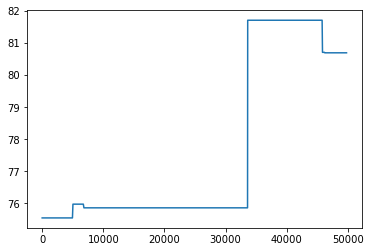

In [21]:
import matplotlib.pylab as plt

lists = sorted(acc_map.items()) # sorted by key, return a list of tuples

x, y = zip(*lists) # unpack a list of pairs into two tuples

plt.plot(x, y)
plt.show()

In [177]:
result = [[]]*len(validd)
correct=0
wrong = 0
for i in range(len(validd)):
    result[i]=Test(validd[i], root)
    if (result[i]==labelvalid[i]):
        correct+=1
    else:
        wrong+=1
print("accuracy:", correct, wrong, correct/(wrong+correct))

accuracy: 2395 605 0.7983333333333333


In [247]:
#majority classifier accuracy
p=0
n=0
for i in range(len(traind)):
    if (labeld[i]==1):
            p+=1
    else:
            n+=1
print(p, n)



6701 20299


In [248]:
correct=0
for i in range(len(traind)):
    if (labeld[i]==0):
        correct+=1
print(correct/len(traind)*100)

75.18148148148148


In [152]:
push = [1,2,3,4]
pull = list(push)
pull.append(5)
print(push)
print(pull)

[1, 2, 3, 4]
[1, 2, 3, 4, 5]


In [73]:
p = [[]]*2
# p[0].append(5)
# p[1].append(6)
# p[1].append(7)
# print(p[0])
#p[0]=[1,2,3]

p[0].append(4)
print(p)

[[4], []]


In [155]:
a = []
push = [-1,-2,-3]
for i in range(3):
    pull=list(push)
    pull.append(i)
    a.append(pull)
print(a)

[[-1, -2, -3, 0], [-1, -2, -3, 1], [-1, -2, -3, 2]]


0
attr_avail size: 0
about to return: 0


ValueError: min() arg is an empty sequence

In [153]:
min(dict, key=dict.get)

'c'

In [146]:
dict(4,300)

AttributeError: 'dict' object has no attribute 'append'

In [189]:
P = [[]]*5
P[1]=2
P[2]=5
P[3]=-2
P[4]=4
P[0]=6



In [219]:
u = {}
u[1]=5
print(u)

{1: 5}


In [91]:
q = [[]]*5
for i in range(5):
    q[i] = []
q[3]=6
print(q)

[[], [], [], 6, []]
